# Libraries to be imported

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, sosfiltfilt
from ecg_detectors.ecgdetectors import panPeakDetect, searchBack, MWA
from ecg_detectors.ecgdetectors import Detectors
import wfdb
import scipy.signal as signal
import peakutils
import os
import plotly.graph_objects as go

import operator

import warnings
warnings.filterwarnings('ignore')

# Loading the Data

In [3]:
flist = os.listdir('../data/ECGdata/Person_02/')
flist = [file for file in flist if file.endswith('.dat')]

In [4]:
records={}
signal_slice={}
filtered_signal={}
smoothed_signal={}
r_peaks={}
flist = os.listdir('../data/ECGdata/Person_02/')
flist = [file for file in flist if file.endswith(".dat")]   
for file in flist:
    records[file] = wfdb.rdrecord('../data/ECGdata/Person_02/'+file[:-4],channels=[1])

In [5]:
data={}
for rec in records:
    data[rec] = np.ndarray.flatten(records[rec].p_signal[:])

In [6]:
times={}
fs={}
for rec in records:
    fs[rec]=records[rec].__dict__['fs']
    times[rec] = np.arange(data[rec].shape[0], dtype='float') / fs[rec]

# Pre-processing the signal

In [7]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    sos = butter(order, [low, high], analog=False, btype="band", output="sos")
    return sos

def butter_bandpass_forward_backward_filter(data, lowcut, highcut, fs, order=1):
    sos = butter_bandpass(lowcut, highcut, fs, order=order)
    y = sosfiltfilt(sos,
                    data)  # Apply a digital filter forward and backward to a signal.This function applies a linear digital filter twice, once forward and once backwards. The combined filter has zero phase and a filter order twice that of the original.
    return y

# CHOOSING PAN_TOMPKINS_DETECTOR, AS IT IS THE MOST EFFICIENT R-PEAK DETECTOR

In [8]:
def pan_tompkins_detector(raw_ecg, mwa, squared, fs, N):
#     N = int(0.12 * fs)
    
#     mwa = MWA(squared, N)
#     mwa[:int(0.2 * fs)] = 0

    

    N = int(N / 100 * fs)
    mwa_peaks = panPeakDetect(mwa, fs)

    r_peaks = searchBack(mwa_peaks, raw_ecg, N)

    return r_peaks

In [9]:
lowcut = 0.05 * 3.3  
highcut = 15 
x={}
times={}
y={}
for rec in records:
    x[rec] = data[rec][:]
    times[rec] = np.arange(x[rec].shape[0], dtype='float') / fs[rec]
    y[rec] = butter_bandpass_forward_backward_filter(x[rec], lowcut, highcut, fs[rec], order=5)

# Finding : r-peaks

In [10]:
differentiated_ecg_measurements={}
squared_ecg_measurements={}
integration_window = 50
integrated_ecg_measurements={}
rpeaks={}
for rec in records:
    differentiated_ecg_measurements[rec] = np.ediff1d(y[rec])

    # Squaring - intensifies values received in derivative. 
    # This helps restrict false positives caused by T waves with higher than usual spectral energies..
    squared_ecg_measurements[rec] = differentiated_ecg_measurements[rec] ** 2

    # Moving-window integration.
    # Change proportionally when adjusting frequency (in samples)
    integrated_ecg_measurements[rec] = np.convolve(squared_ecg_measurements[rec], np.ones(integration_window))

    # Fiducial mark - peak detection on integrated measurements.
    rpeaks[rec] = pan_tompkins_detector(data[rec], integrated_ecg_measurements[rec], squared_ecg_measurements[rec], fs[rec], integration_window)
    
    

# Plot to check the r_peaks

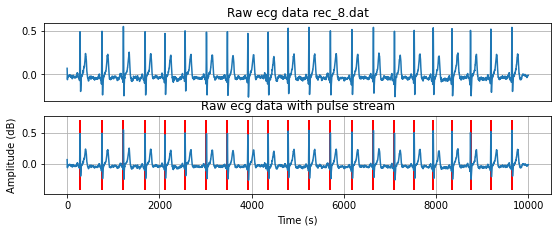

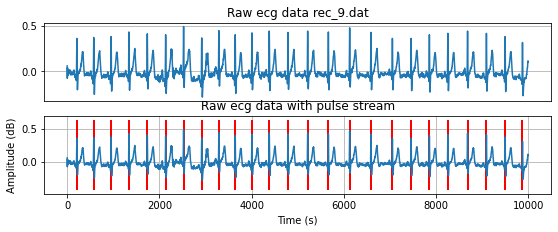

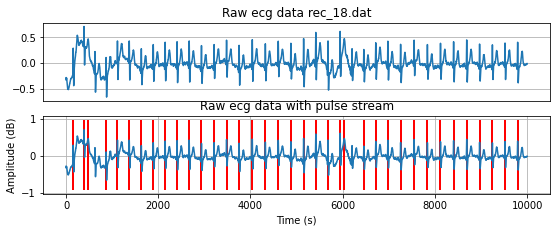

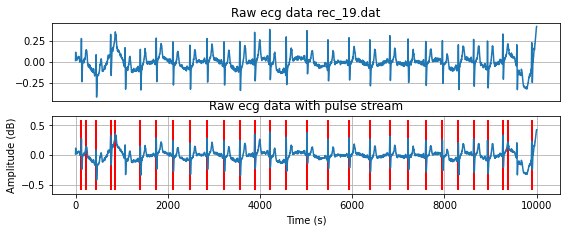

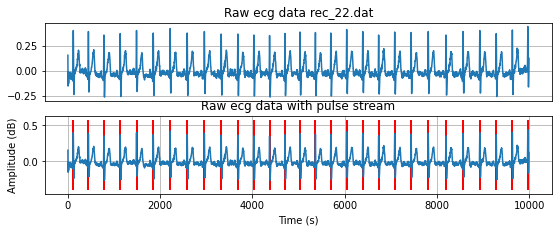

...

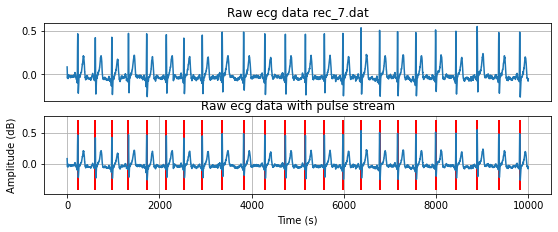

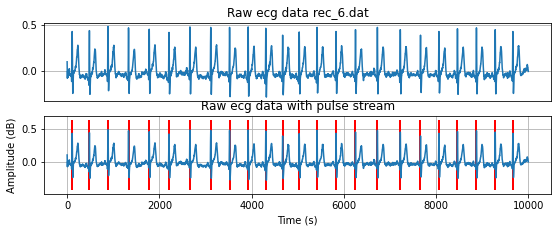

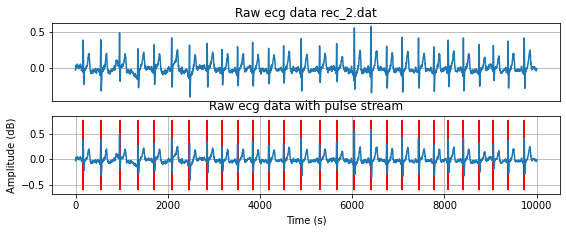

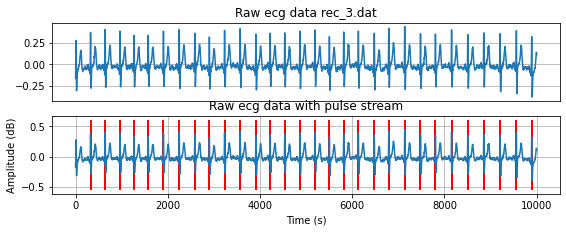

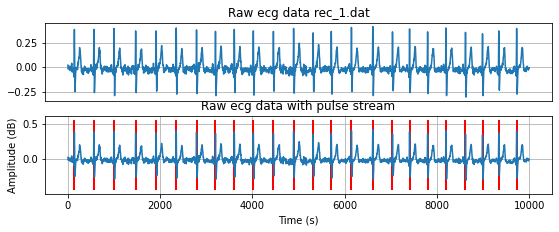

In [11]:
figsize = (20, 10)

ymin={}
ymax={}

for rec in records:
    plt.figure(figsize=figsize)

    plt.subplot2grid((6, 2), (0, 0))
    # plt.subplot(621)
    # plt.figure(1, figsize=left_figsize)
    # plt.clf()
    plt.xticks([])
    plt.plot(data[rec])
    plt.title("Raw ecg data "+str(rec))
    plt.grid(True)
    
    ymin[rec] = np.min(data[rec])
    ymax[rec] = np.max(data[rec])
    alpha = 0.2 * (ymax[rec] - ymin[rec])
    ymax[rec] += alpha
    ymin[rec] -= alpha

    # plt.figure(figsize=left_figsize)
    # plt.subplot(626)
    plt.subplot2grid((6, 2), (1, 0))
    # plt.clf()
    plt.ylabel("Amplitude (dB)")
    # Calculate time values in seconds
    times = np.arange(data[rec].shape[0], dtype='float')
    plt.xlabel("Time (s)")
    plt.plot(times, data[rec])
    plt.vlines(rpeaks[rec], ymin[rec], ymax[rec],
               color="r",
               linewidth=2,
               label="R-peaks")
    plt.title("Raw ecg data with pulse stream")
    plt.grid(True)

# RMSE AND MSE APPROACH

# Crop the signal from rpeaks 
# Determine the min_length of a signal

Since the r-peak detected at the initial time of a signal is improper. I've consider the minimum distance between the r-peaks be the average of smallest distance and largest distance.

In [12]:
min_dist={}
min_dist_mn={}
for rec in records:
    min_dist_mn[rec]=[]
    for peak in range(len(rpeaks[rec])-1):
        min_dist_mn[rec].append(rpeaks[rec][peak+1]-rpeaks[rec][peak])
    dist_min = min(min_dist_mn[rec])
    dist_max = max(min_dist_mn[rec])
    dist_avg = (dist_min+dist_max)//2
    min_dist[rec]=  integration_window# HYPER-PARAMETER      

# Slicing the signal

In [13]:
series_slice={}
map_slice={}
for rec in records:
    count=0
    series_slice[rec]={}
    map_slice[rec]=[]
    for peak in range(len(rpeaks[rec])-1):
        if len(data[rec][rpeaks[rec][peak]:rpeaks[rec][peak+1]])>min_dist[rec]:
            series_slice[rec][count]=data[rec][rpeaks[rec][peak]:rpeaks[rec][peak+1]]
            count=count+1
            if count==1:
                map_slice[rec].append([count,peak])

In [14]:
map_sum={}
for rec in records:
    map_sum[rec]=[]
    for i in map_slice[rec]:
        map_sum[rec].append(i[1]-i[0])

# Plotting the sliced signals

In [15]:
import plotly.graph_objects as go
fig=go.Figure()
for rec in records:
    for peak in range(len(series_slice[rec])-1):
        fig.add_trace(go.Scatter(
            y=series_slice[rec][peak],
            mode="lines",
            name=rec
    ))
# Titles=""
# for i in range(num_discords):
#     Title=discords['sel803.dat'][i][0]
#     Titles+=" "+str(Title)
fig.update_layout(
title="Signal_slice",
xaxis_title="X",
yaxis_title="F",
autosize=True,
margin=dict(
    l=50,
    r=50,
    b=100,
    t=100,
    pad=20
),
# paper_bgcolor="LightSteelBlue",
font=dict(
    family="Courier New, monospace",
    size=18,
    color="Blue"
    )
)
fig.show()

# RMSE

In [16]:
def rms_dd(s_array):
    rmse_={}
    for i in range(len(s_array)):
        data1f=np.array(s_array[i][:50])
        data1l=np.array(s_array[i][-50:])
        data1=np.concatenate((data1f,data1l),axis=0)
#         data1=np.array(s_array[i])
        rmse_[i]={}
        
        for j in range(len(s_array)):
            sum1=0
            data2f=np.array(s_array[j][:50])
            data2l=np.array(s_array[j][-50:])
            data2=np.concatenate((data2f,data2l),axis=0)
#             data2=np.array(s_array[j])
#             if len(s_array[i])>len(s_array[j]):
#                 data1=s_array[i][0:(len(s_array[i])-(len(s_array[i])-len(s_array[j])))]
#             elif len(s_array[j]>len(s_array[i])):
#                 data2=s_array[j][0:(len(s_array[j])-(len(s_array[j])-len(s_array[i])))]
            for k in range(len(data1)):
                m=len(data1)
                sum1=sum1+((abs(data1[k]-data2[k]))**2)
            rmse_[i][j]=(np.sqrt(sum1))/m
    return rmse_

# MSE

In [17]:
def mse_dd(s_array):
    mse_={}

    for i in range(len(s_array)):
        data1=np.array(s_array[i])
        mse_[i]={}
        
        for j in range(len(s_array)):
            sum1=0
            data2=np.array(s_array[j])
            if len(s_array[i])>len(s_array[j]):
                data1=s_array[i][0:(len(s_array[i])-(len(s_array[i])-len(s_array[j])))]
            elif len(s_array[j]>len(s_array[i])):
                data2=s_array[j][0:(len(s_array[j])-(len(s_array[j])-len(s_array[i])))]
                
            #Normalize the data b/w 0 and 1
            
            norm1=((data1-min(data1))/(max(data1)-min(data1)))
            norm2=((data2-min(data2))/(max(data2)-min(data2)))

            for k in range(len(norm1)):
                m=len(norm1)
                sum1=sum1+((abs(norm1[k]-norm2[k]))**2)
            mse_[i][j]=(sum1)/m
    return mse_

In [18]:
rmse={}
for rec in records:
    rmse[rec]=rms_dd(series_slice[rec])

In [19]:
mse={}
for rec in records:
    mse[rec]=mse_dd(series_slice[rec])

# Pointwise-RMSE:
### For each point in the data, calculate RMSE for each point with respect to the other points in the data. Construct a symmetric matrix using the RMSE values. Plot the symmetric matrix. Using colorbar, pick out the indices which are above some defined threshold.

In [27]:
def point_rmse(s_array):
    pts={}
    
    for i in range(len(s_array)):
        pts[i]={}
        for j in range(len(s_array)):
            pts[i][j]=(abs(s_array[i]-s_array[j])**2)
    return pts

In [58]:
pts={}
# for rec in records:
pts['rec_18.dat'] = point_rmse(data['rec_18.dat'])
#     break

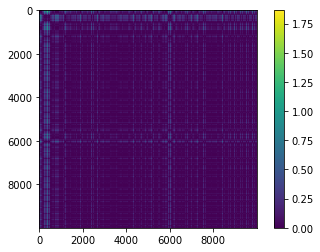

In [62]:

import pandas as pd
df = pd.DataFrame(pts['rec_18.dat'])

plt.imshow(df)
plt.colorbar()

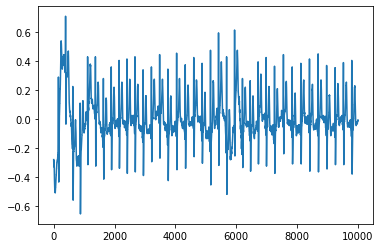

In [59]:
plt.plot(data['rec_18.dat'][:])

# For each record, for each signal slice, the signal with maximum RMSE is picked :

In [22]:
def abnormal_discord_rmse():
    v={}
    for rec in records:
        v[rec]={}
        for val in range(len(rmse[rec])):
            val1=[(x,y) for x,y in rmse[rec][val].items() if y==max(rmse[rec][val].values())]
            v[rec][val]=val1
            v[rec][val]=np.array(v[rec][val]).flatten()
    return v

In [23]:
def abnormal_discord_mse():
    v={}
    for rec in records:
        v[rec]={}
        for val in range(len(mse[rec])):
            val1=[(x,y) for x,y in mse[rec][val].items() if y==max(mse[rec][val].values())]
            v[rec][val]=val1
            v[rec][val]=np.array(v[rec][val]).flatten()
    return v

In [24]:
ab_discords_rmse=abnormal_discord_rmse()

In [25]:
ab_discords_mse=abnormal_discord_mse()

In [26]:
ab_discords_mse

{'rec_8.dat': {0: array([8.        , 0.01154126]),
  1: array([8.00000000e+00, 7.03186135e-03]),
  2: array([8.        , 0.00890692]),
  3: array([1.70000000e+01, 7.71111856e-03]),
  4: array([1.70000000e+01, 6.54286035e-03]),
  5: array([8.        , 0.01263884]),
  6: array([1.70000000e+01, 6.86267548e-03]),
  7: array([1.7000000e+01, 6.8865201e-03]),
  8: array([1.70000000e+01, 1.17859714e-02]),
  9: array([1.70000000e+01, 6.74553099e-03]),
  10: array([8.        , 0.01167137]),
  11: array([8.        , 0.00936279]),
  12: array([8.00000000e+00, 7.68636131e-03]),
  13: array([8.00000000e+00, 7.55286828e-03]),
  14: array([8.        , 0.01254667]),
  15: array([5.        , 0.00907283]),
  16: array([8.00000000e+00, 7.95715297e-03]),
  17: array([8.        , 0.01178597]),
  18: array([1.70000000e+01, 6.69477066e-03]),
  19: array([1.70000000e+01, 6.31153893e-03]),
  20: array([8.        , 0.01156578])},
 'rec_9.dat': {0: array([6.        , 0.02460709]),
  1: array([6.        , 0.022949

# Counting the No. of times the signal being detected as abnormal

In [27]:
def count_rmse():
    count={}
    for rec in records:
        count[rec]={}
        ind=-1
        pre_val={0}
        for i in ab_discords_rmse[rec].values():
            val=i[0]
            k=0
            if val not in pre_val:
                ind=ind+1
            for j in ab_discords_rmse[rec].values():
                if j[0]==val:
                    k=k+1
            if val not in pre_val:
                count[rec][ind]=[val,k]
            pre_val.add(i[0])
    return count

In [28]:
def count_mse():
    count={}
    for rec in records:
        count[rec]={}
        ind=-1
        pre_val={0}
        for i in ab_discords_mse[rec].values():
            val=i[0]
            k=0
            if val not in pre_val:
                ind=ind+1
            for j in ab_discords_mse[rec].values():
                if j[0]==val:
                    k=k+1
            if val not in pre_val:
                count[rec][ind]=[val,k]
            pre_val.add(i[0])
    return count

# Selecting Top 5 signals

In [29]:
def max_dd_rmse(count_rmse):
    max_dd={}
    cnt_ind={}
    cnt_val={}
    for rec in records:
        max_dd[rec]=[]
        cnt_ind[rec]=[]
        cnt_val[rec]=[]
        for i in count_rmse[rec].values():
            cnt_ind[rec].append(i[0])
            cnt_val[rec].append(i[1])
        if len(count_rmse[rec])>5:
            for i in range(5):
                m_val=max(cnt_val[rec])
                m_ind=cnt_val[rec].index(m_val)
                cnt_val[rec].remove(m_val)
                max_dd[rec].append(cnt_ind[rec][m_ind])
                cnt_ind[rec].remove(cnt_ind[rec][m_ind])
            max_dd[rec]=set(max_dd[rec])
            max_dd[rec]=list(max_dd[rec])
        else:
            for i in range(len(count_rmse[rec])):
                m_val=max(cnt_val[rec])         
                m_ind=cnt_val[rec].index(m_val)
                cnt_val[rec].remove(m_val)
                max_dd[rec].append(cnt_ind[rec][m_ind])
                cnt_ind[rec].remove(cnt_ind[rec][m_ind])
            max_dd[rec]=set(max_dd[rec])
            max_dd[rec]=list(max_dd[rec])
    return max_dd

In [30]:
def max_dd_mse(count_mse):
    max_dd={}
    cnt_ind={}
    cnt_val={}
    for rec in records:
        max_dd[rec]=[]
        cnt_ind[rec]=[]
        cnt_val[rec]=[]
        for i in count_mse[rec].values():
            cnt_ind[rec].append(i[0])
            cnt_val[rec].append(i[1])
        if len(count_mse[rec])>5:
            for i in range(5):
                m_val=max(cnt_val[rec])
                m_ind=cnt_val[rec].index(m_val)
                cnt_val[rec].remove(m_val)
                max_dd[rec].append(cnt_ind[rec][m_ind])
                cnt_ind[rec].remove(cnt_ind[rec][m_ind])
            max_dd[rec]=set(max_dd[rec])
            max_dd[rec]=list(max_dd[rec])
        else:
            for i in range(len(count_mse[rec])):
                m_val=max(cnt_val[rec])         
                m_ind=cnt_val[rec].index(m_val)
                cnt_val[rec].remove(m_val)
                max_dd[rec].append(cnt_ind[rec][m_ind])
                cnt_ind[rec].remove(cnt_ind[rec][m_ind])
            max_dd[rec]=set(max_dd[rec])
            max_dd[rec]=list(max_dd[rec])
    return max_dd

In [31]:
cnt_rmse=count_rmse()
cnt_mse=count_mse()
max_rmse=max_dd_rmse(cnt_rmse)
max_mse=max_dd_mse(cnt_mse)

In [32]:
max_mse

{'rec_8.dat': [8.0, 17.0, 5.0],
 'rec_9.dat': [6.0, 7.0],
 'rec_18.dat': [2.0, 22.0, 23.0],
 'rec_19.dat': [3.0, 1.0, 27.0],
 'rec_22.dat': [1.0, 3.0, 4.0, 11.0, 13.0],
 'rec_21.dat': [5.0],
 'rec_20.dat': [1.0, 6.0, 7.0],
 'rec_11.dat': [1.0, 10.0, 4.0, 7.0],
 'rec_10.dat': [3.0, 5.0, 11.0, 14.0, 19.0],
 'rec_12.dat': [2.0, 11.0, 22.0],
 'rec_13.dat': [13.0],
 'rec_17.dat': [10.0, 11.0, 12.0, 7.0],
 'rec_16.dat': [19.0, 20.0],
 'rec_14.dat': [17.0, 18.0],
 'rec_15.dat': [1.0, 2.0, 11.0, 13.0, 16.0],
 'rec_4.dat': [1.0, 3.0, 4.0, 10.0, 13.0],
 'rec_5.dat': [4.0, 10.0, 15.0, 18.0, 20.0],
 'rec_7.dat': [1.0, 2.0, 9.0, 12.0, 15.0],
 'rec_6.dat': [2.0, 7.0, 11.0, 12.0, 19.0],
 'rec_2.dat': [2.0, 6.0],
 'rec_3.dat': [1.0, 11.0, 19.0, 27.0, 28.0],
 'rec_1.dat': [7.0, 14.0, 20.0, 21.0, 22.0]}

# AWDD APPROACH AND BFDD APPROACH

# Calculate Euclidean distance

In [33]:
def early_abandoned_euclidean(a, b, upper_limit):
    """Compute a Euclidean distance value in early abandoning fashion."""
    lim = upper_limit * upper_limit
    res = 0.
    for i in range(0, len(a)):
        res += np.dot((a[i]-b[i]), (a[i]-b[i]))
        if res > lim:
            return np.nan
    return np.sqrt(res)

# AWDD ALGORITHM FOR DETECTING THE ABNORMAL SIGNAL

In [34]:
def find_awdd_detect(series,rpeaks,num_discords):
    discords=list()


    bestDiscord = awdd_detect(series,rpeaks)

    discords=bestDiscord
    
    dis=dict(sorted(discords.items(), key=operator.itemgetter(1),reverse=True))
    
    lis=list(dis.items())
    
    return lis[0:num_discords]


def awdd_detect(series,rpeaks):
    discords1={}
    best_so_far_distance=-1.0
    best_so_far_index=-1.0
    dist=-1.0
    peak_loc={}
    peak_loc=rpeaks
    num_peak=len(peak_loc)-1
    outer_cnt=0
    

    p=peak_loc[0]
    while p<peak_loc[num_peak-2]+1:
        nearest_neighbor_distance=np.inf
        outer_len=peak_loc[outer_cnt+1]-peak_loc[outer_cnt]

        inner_cnt=0
        q=peak_loc[0]
        datap=series[peak_loc[outer_cnt]:peak_loc[outer_cnt+1]]
        while q<peak_loc[num_peak-2]+1:
            inner_len=peak_loc[inner_cnt+1]-peak_loc[inner_cnt]
            dataq=series[peak_loc[inner_cnt]:peak_loc[inner_cnt+1]]
            if (outer_len>inner_len):
                datap=series[peak_loc[outer_cnt]:peak_loc[(outer_cnt+1)]-(outer_len-inner_len)]
            if (inner_len>outer_len):
                dataq=series[peak_loc[inner_cnt]:peak_loc[inner_cnt+1]-(inner_len-outer_len)]
                
            dist = early_abandoned_euclidean(datap, dataq, nearest_neighbor_distance)

            if abs(p-q)>=min(outer_len,inner_len):
                if (~np.isnan(dist)) and (dist < nearest_neighbor_distance):
                    nearest_neighbor_distance = dist
                    discords1[p] = nearest_neighbor_distance

            inner_cnt+=1
            q=peak_loc[inner_cnt]

        if ~(np.inf == nearest_neighbor_distance) and (nearest_neighbor_distance > best_so_far_distance):
            best_so_far_distance = nearest_neighbor_distance
            best_so_far_index = p
            
        outer_cnt+=1
        p=peak_loc[outer_cnt]
#     return best_so_far_index,best_so_far_distance,discords1
    return discords1

In [35]:
awdd_discords={}
num_discords=5
awdd_max_discords={}
for rec in records: 
    awdd_discords[rec]=find_awdd_detect(data[rec],rpeaks[rec],num_discords)
for rec in records:
    awdd_max_discords[rec]=[]
    for i in range(len(awdd_discords[rec])):
        if awdd_discords[rec][i][1]!=0.0:
            awdd_max_discords[rec].append(awdd_discords[rec][i])
awdd_max_discords[rec].sort()

In [36]:
awdd_max_discords

{'rec_8.dat': [],
 'rec_9.dat': [],
 'rec_18.dat': [(6032, 2.4149327112778938),
  (5681, 1.7503642478067236),
  (390, 1.277115891373997),
  (156, 0.9668376285602462),
  (7255, 0.9413819628609841)],
 'rec_19.dat': [(864, 1.8411205826887063),
  (230, 1.2742252548117223),
  (762, 1.1286274850454423),
  (446, 1.0235843883139288),
  (2481, 0.5671639974469457)],
 'rec_22.dat': [],
 'rec_21.dat': [],
 'rec_20.dat': [],
 'rec_11.dat': [],
 'rec_10.dat': [],
 'rec_12.dat': [],
 'rec_13.dat': [],
 'rec_17.dat': [],
 'rec_16.dat': [],
 'rec_14.dat': [(5203, 2.4677773400369816),
  (4520, 0.820883670199377),
  (3590, 0.7331609645909961),
  (8402, 0.6767939125021732),
  (2215, 0.6313873612925746)],
 'rec_15.dat': [],
 'rec_4.dat': [],
 'rec_5.dat': [],
 'rec_7.dat': [],
 'rec_6.dat': [],
 'rec_2.dat': [],
 'rec_3.dat': [(965, 0.589830484122345),
  (8852, 0.5194708846509111),
  (9205, 0.4993746088859546),
  (8154, 0.4123408784003838),
  (3911, 0.41161268202036727)],
 'rec_1.dat': []}

# BFDD APPROACH FOR DETECTING THE ABNORMAL SIGNAL

In [37]:
def find_bfdd_detect(series,win_size,num_discords):
    discords=list()
    
    bestDiscord = bfdd_detect(series,win_size)
    
    discords=bestDiscord
    
    dis=dict(sorted(discords.items(), key=operator.itemgetter(1),reverse=True))
    
    lis=list(dis.items())
    
    return lis[0:num_discords]

def bfdd_detect(series,win_size):
    discords1={}
    best_so_far_distance=-1.0
    best_so_far_index=-1.0
    dist=-1.0
#     peak_loc={}
#     peak_loc=rpeaks
#     num_peak=len(peak_loc)-1
    outer_cnt=0
    p=0
    while p<len(series)-(2*win_size)+1:
        nearest_neighbor_distance=np.inf
        outer_len=win_size*(outer_cnt+1)-win_size*(outer_cnt)

        inner_cnt=0
        q=0
        datap=series[win_size*outer_cnt:win_size*(outer_cnt+1)]
        
        while q<len(series)-(2*win_size)+1:
            inner_len=win_size*(inner_cnt+1)-win_size*(inner_cnt)
            dataq=series[win_size*inner_cnt:win_size*(inner_cnt+1)]
            
            if (outer_len>inner_len):
                datap=series[win_size*outer_cnt:win_size*(outer_cnt+1)-(outer_len-inner_len)]
            if (inner_len>outer_len):
                dataq=series[win_size*inner_cnt:win_size*(inner_cnt+1)-(inner_len-outer_len)]
                
            dist = early_abandoned_euclidean(datap, dataq, nearest_neighbor_distance)

            if abs(p-q)>=min(outer_len,inner_len):
                if (~np.isnan(dist)) and (dist < nearest_neighbor_distance):
                    nearest_neighbor_distance = dist
                    discords1[p] = nearest_neighbor_distance

            inner_cnt+=1
            q=win_size*inner_cnt
        if ~(np.inf == nearest_neighbor_distance) and (nearest_neighbor_distance > best_so_far_distance):
            best_so_far_distance = nearest_neighbor_distance
            best_so_far_index = p
            
        outer_cnt+=1
        p=win_size*outer_cnt
#     return best_so_far_index,best_so_far_distance,discords1
    return discords1

In [38]:
bfdd_discords={}
num_discords=5
win_size=200
bfdd_max_discords={}
for rec in records: 
    bfdd_discords[rec]=find_bfdd_detect(data[rec],win_size,num_discords)
for rec in records:
    bfdd_max_discords[rec]=[]
    for i in range(len(bfdd_discords[rec])):
        if bfdd_discords[rec][i][1]!=0.0:
            bfdd_max_discords[rec].append(bfdd_discords[rec][i])
bfdd_max_discords[rec].sort()

In [39]:
bfdd_max_discords

{'rec_8.dat': [(1600, 1.625707538273721),
  (5600, 1.6134125324913027),
  (7000, 1.5973180647572982),
  (7800, 1.579414448458669),
  (6000, 1.5143810616882398)],
 'rec_9.dat': [(3600, 1.8393816895902824),
  (8600, 1.5442392949280885),
  (5600, 1.534462446591639),
  (2800, 1.4088293012285054),
  (4000, 1.3338665600426438)],
 'rec_18.dat': [(200, 4.193098496338954),
  (0, 2.9362731480569026),
  (800, 2.9362731480569026),
  (5800, 2.6834446146697335),
  (600, 2.677657558389422)],
 'rec_19.dat': [(9600, 2.1692971211892575),
  (8600, 1.5458816254810714),
  (9200, 1.52853688211963),
  (400, 1.4109128250887788),
  (800, 1.4007676466852024)],
 'rec_22.dat': [(1800, 1.4293792358922799),
  (0, 1.4174713400982748),
  (4600, 1.3343256723903647),
  (5600, 1.3343256723903647),
  (3200, 1.3033898112230273)],
 'rec_21.dat': [(3600, 2.0590653219361457),
  (2200, 1.8893120441049425),
  (6000, 1.7734147850968203),
  (800, 1.772639275205196),
  (4600, 1.772639275205196)],
 'rec_20.dat': [(5400, 1.96359364

# Plot to Compare Anomalous signals obtained through RMSE,MSE and AWDD

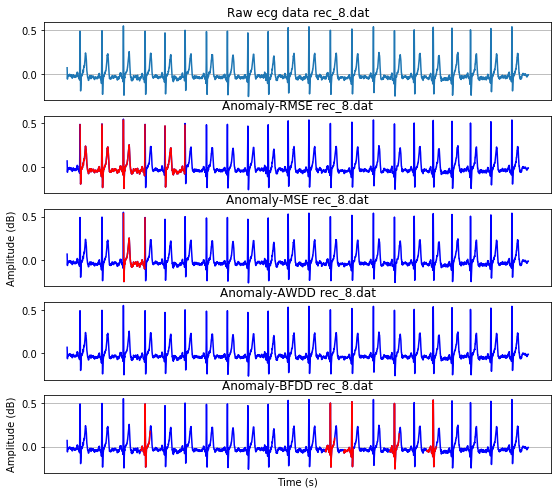

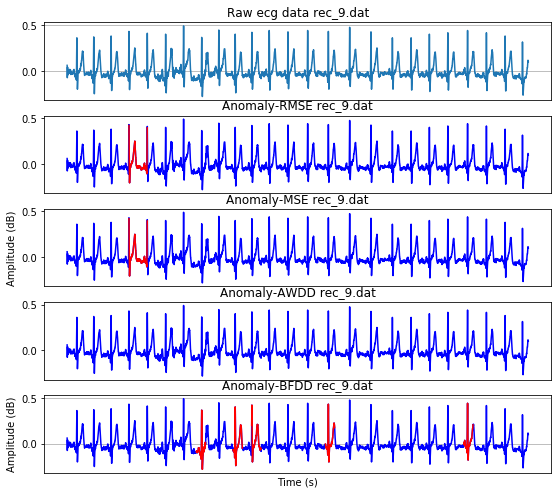

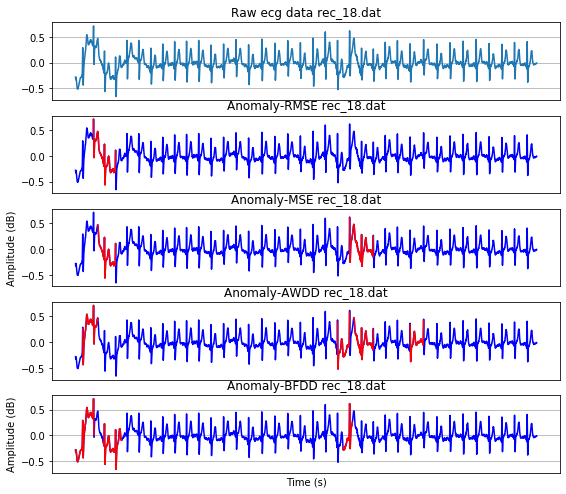

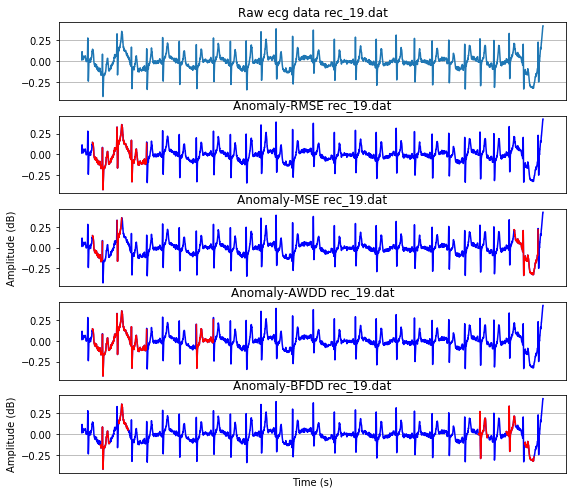

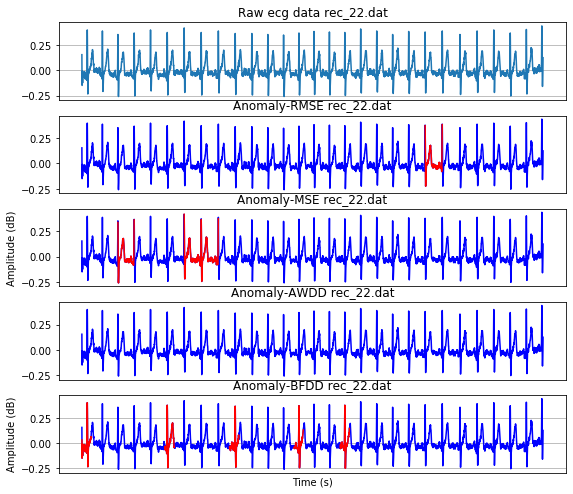

...

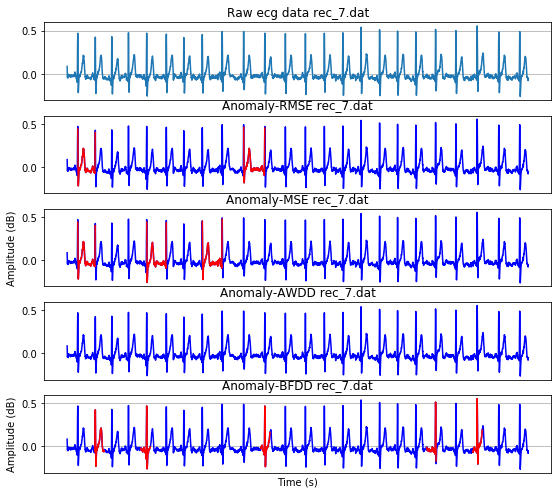

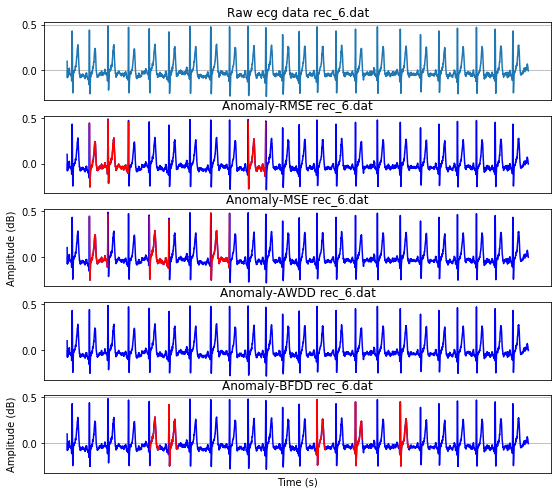

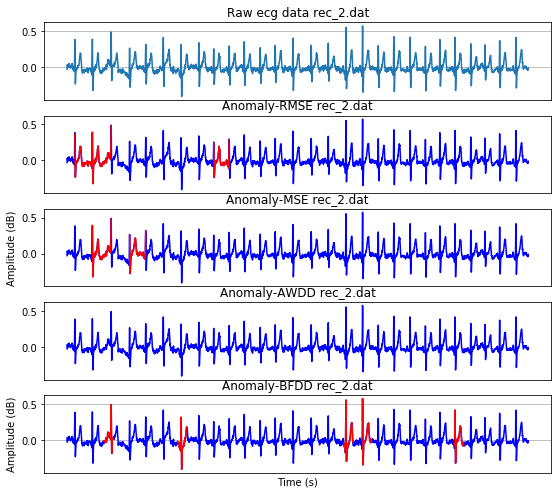

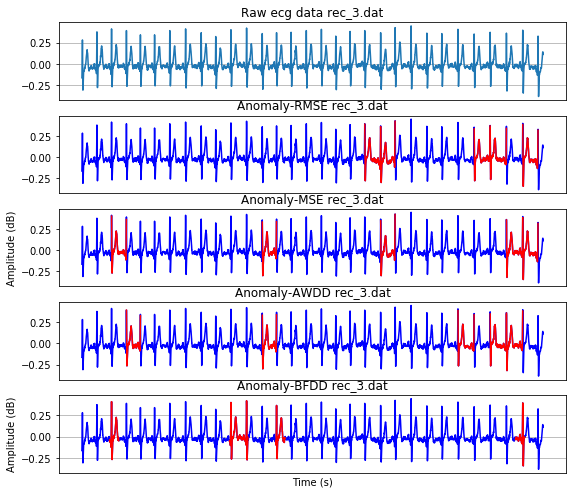

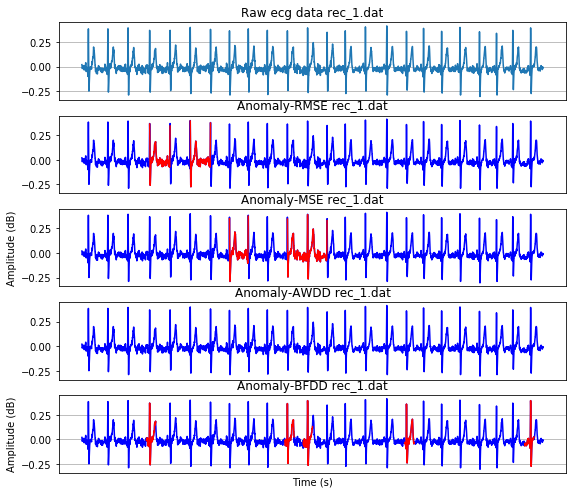

In [40]:
figsize = (20, 10)

ymin={}
ymax={}

for rec in records:
    plt.figure(figsize=figsize)

    plt.subplot2grid((6, 2), (0, 0))
    # plt.subplot(621)
    # plt.figure(1, figsize=left_figsize)
    # plt.clf()
    plt.xticks([])
    plt.plot(data[rec])
    plt.title("Raw ecg data "+str(rec))
    plt.grid(True)
    
    ymin[rec] = np.min(data[rec])
    ymax[rec] = np.max(data[rec])
    alpha = 0.2 * (ymax[rec] - ymin[rec])
    ymax[rec] += alpha
    ymin[rec] -= alpha

    # plt.figure(figsize=left_figsize)
    # plt.subplot(626)
    plt.subplot2grid((6, 2), (1, 0))
    plt.xticks([])
    # plt.clf()
#     plt.ylabel("Amplitude (dB)")
    # Calculate time values in seconds
    times = np.arange(data[rec].shape[0], dtype='float')
#     plt.xlabel("Time (s)")
    plt.plot(data[rec],color='b')
    for i in range(len(max_rmse[rec])):
#         plt.plot(np.concatenate((data[rec][:r_peaks[rec][int(max_dd[rec][i])+(map_sum[rec][0])]-1],data[rec][r_peaks[rec][int(max_dd[rec][i])]+1:r_peaks[rec][int(max_dd[rec][i])+1]]),axis=0),color='b')
        plt.plot(range(rpeaks[rec][int(max_rmse[rec][i])]+1,rpeaks[rec][int(max_rmse[rec][i])+1]),data[rec][rpeaks[rec][int(max_rmse[rec][i])]+1:rpeaks[rec][int(max_rmse[rec][i])+1]],color='r')
    plt.title("Anomaly-RMSE "+str(rec))
    
    plt.subplot2grid((6, 2), (2, 0))
    plt.xticks([])
    # plt.clf()
    plt.ylabel("Amplitude (dB)")
    # Calculate time values in seconds
    times = np.arange(data[rec].shape[0], dtype='float')
    
    plt.plot(data[rec],color='b')
    for i in range(len(max_mse[rec])):
#         plt.plot(np.concatenate((data[rec][:r_peaks[rec][int(max_dd[rec][i])+(map_sum[rec][0])]-1],data[rec][r_peaks[rec][int(max_dd[rec][i])]+1:r_peaks[rec][int(max_dd[rec][i])+1]]),axis=0),color='b')
        plt.plot(range(rpeaks[rec][int(max_mse[rec][i])]+1,rpeaks[rec][int(max_mse[rec][i])+1]),data[rec][rpeaks[rec][int(max_mse[rec][i])]+1:rpeaks[rec][int(max_mse[rec][i])+1]],color='r')
    plt.title("Anomaly-MSE "+str(rec))
    
    plt.subplot2grid((6, 2), (3, 0))
    plt.xticks([])
    # plt.clf()
#     plt.ylabel("Amplitude (dB)")
    # Calculate time values in seconds
    times = np.arange(data[rec].shape[0], dtype='float')
#     plt.xlabel("Time (s)")
    plt.plot(data[rec],color='b')
    for i in range(len(awdd_max_discords[rec])):
        indrpk1 = list(rpeaks[rec]).index(awdd_max_discords[rec][i][0])
#         plt.plot(np.concatenate((data[rec][:r_peaks[rec][int(max_dd[rec][i])+(map_sum[rec][0])]-1],data[rec][r_peaks[rec][int(max_dd[rec][i])]+1:r_peaks[rec][int(max_dd[rec][i])+1]]),axis=0),color='b')
        plt.plot(range(rpeaks[rec][indrpk1]+1,rpeaks[rec][indrpk1+1]),data[rec][rpeaks[rec][indrpk1]+1:rpeaks[rec][indrpk1+1]],color='r')
    plt.title("Anomaly-AWDD "+str(rec))
    
    plt.subplot2grid((6, 2), (4, 0))
    plt.xticks([])
    # plt.clf()
    plt.ylabel("Amplitude (dB)")
    # Calculate time values in seconds
    times = np.arange(data[rec].shape[0], dtype='float')
    plt.xlabel("Time (s)")
    plt.plot(data[rec],color='b')
    for i in range(len(bfdd_max_discords[rec])):
        indrpk1 = bfdd_max_discords[rec][i][0]
#         plt.plot(np.concatenate((data[rec][:r_peaks[rec][int(max_dd[rec][i])+(map_sum[rec][0])]-1],data[rec][r_peaks[rec][int(max_dd[rec][i])]+1:r_peaks[rec][int(max_dd[rec][i])+1]]),axis=0),color='b')
        plt.plot(range(indrpk1+1,indrpk1+win_size+1),data[rec][indrpk1+1:indrpk1+win_size+1],color='r')
    plt.title("Anomaly-BFDD "+str(rec))
    
    plt.grid(True)